# An Example of Holoviews Visualization

## Description
The gridded dataset interface of Holoviews is used. (http://holoviews.org/getting_started/Gridded_Datasets.html).


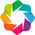

In [33]:
import numpy as np
import pypostpiv as ppv
import holoviews as hv
hv.extension('bokeh')

import os

In [34]:
"""Load the vc7 test data"""
ppv.utilities.convert_2d_2c_vc7('./test1/', './test1.h5')



In [35]:
"""Create the example 2D2C project"""
example = ppv.piv.Project2D2C('./test1.h5')


In [36]:
example.list_data()

cam_1
----grid_size
--------dx
--------dy
----velocity
--------u
--------x
--------y
--------v
cam_0
----grid_size
--------dx
--------dy
----velocity
--------u
--------x
--------y
--------v


In [83]:
"""Plot it"""
%opts Image [tools=['hover']]
# CFirst we must wrap the data in a Holowviews Dataset object
# Here key dimensions are: t, x, y
# value dimension(s) are/is: vel_mag
(nx, ny, ntime) = example.data['cam_1']['velocity']['u'].shape
(dx, dy, dtime) = (example.data['cam_1']['grid_size']['dx'],
                   example.data['cam_1']['grid_size']['dy'],
                   1.0)
x = dx*np.arange(nx)
y = dy*np.arange(ny)
time = dtime*np.arange(ntime)
u = example.data['cam_1']['velocity']['u']

# Something weird in the dataset creation is although u has shape
# (  nx, ny, nt), you must specify the key dimensions in the order
# (time,  y,  x) ??
u_magnitude_ds = hv.Dataset(
    (time, y, x, u),
    kdims=['time', 'y', 'x'], vdims=['U Velocity Component'])


image = u_magnitude_ds.to(hv.Image, ['x', 'y'])
point = u_magnitude_ds.to(hv.Points, ['x', 'y'])
image
#point

:HoloMap   [time]
   :Image   [x,y]   (U Velocity Component)